In [1]:
!pip install opencv-python-headless pytesseract numpy matplotlib

In [2]:
!pip install easyocr

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 18.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 71.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 53.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 34.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 93.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 422.8/422.8 kB 24.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9

In [3]:
import easyocr
reader = easyocr.Reader(['tr'], gpu=True)  # use gpu=False if no GPU

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

In [4]:
print("Installing Tesseract OCR engine and language packs...")
!sudo apt update
!sudo apt install -y tesseract-ocr
!sudo apt install -y tesseract-ocr-eng # English language data
!sudo apt install -y tesseract-ocr-tur # Turkish language data

Installing Tesseract OCR engine and language packs...
Hit:1 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:2 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:3 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,632 B]
Get:4 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:5 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Get:6 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Get:7 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Get:9 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [1,853 kB]
Hit:10 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Get:11 http://security.ubuntu.com/ubuntu jammy-security/main amd64 Packages [3,160 kB]
Hit:12 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jamm

In [5]:
import cv2
import pytesseract
import numpy as np
from pytesseract import Output # Specifically import Output for image_to_data
import os
import matplotlib.pyplot as plt
from google.colab import files, drive # For file uploads and Google Drive mounting
from scipy.ndimage import rotate
import re
import os
import json
import re
from difflib import get_close_matches
import pytesseract
from pytesseract import Output
from skimage.filters import threshold_sauvola

In [7]:
def rotate_image_precise(image, angle):
    """
    Rotates an image by a given angle around its center.
    """
    if angle == 0:
        return image
    h, w = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    return cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)


def get_osd_angle(image, lang='tur'):
    """
    Tries to get image rotation angle using Tesseract's OSD.
    Falls back to projection profile if it fails.
    """
    try:
        rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        osd = pytesseract.image_to_osd(rgb, lang=lang)
        for line in osd.split("\n"):
            if "Rotate" in line:
                return int(line.split(":")[1].strip())
    except:
        pass  # Silently fallback to projection

    return estimate_skew_projection(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY))


def estimate_skew_projection(gray):
    """
    Fallback skew estimation using horizontal projection profile.
    """
    def score(arr, angle):
        data = rotate(arr, angle, reshape=False, order=0)
        proj = np.sum(data, axis=1)
        return np.var(proj)

    inverted = cv2.bitwise_not(gray)
    thresh = cv2.threshold(inverted, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

    angles = np.arange(-15, 16, 1)
    scores = [score(thresh, a) for a in angles]
    best_angle = angles[np.argmax(scores)]
    return best_angle


def compute_avg_conf(data):
    """
    Calculates average confidence from valid OCR results.
    """
    confs = []
    for txt, conf in zip(data['text'], data['conf']):
        try:
            val = float(conf)
            if txt.strip() and val > 0:
                confs.append(val)
        except:
            continue
    return np.mean(confs) if confs else 0


def count_keywords(text, keywords):
    """
    Counts keyword occurrences in text (case-insensitive).
    """
    return sum(text.upper().count(k) for k in keywords)


def validate_rotation_with_ocr(image_bgr, lang='tur', debug=False):
    """
    Attempts to find the best rotation angle based on keyword count first, then OCR confidence.
    """
    keywords = [
        'TOPLAM', 'TUTAR', 'KDV', 'TL', 'FATURA', 'TARIH', 'SAAT', 'İŞLEM', 'MÜŞTERİ', 'BAŞARILI', 'TARİH', 'SATIŞ',
        'TUTARI', 'YERMİNAL', 'GARANTİ', 'ONAY', 'MERSIS', 'MERSİS', 'KART', 'BANKA', 'NO', 'ADET', 'ISLEM',
        'PARAMETRE', 'YUKLEME', 'BASARİLİ', 'TERMİNAL', 'ISYERİ', 'TERMINAL', 'BATCH', 'GARANTI BBVA', 'DENIZBANK',
        'TOPKDV', '1,00 TL'
    ]
    best_angle = None
    best_keyword_count = -1
    best_conf = -1
    best_image = image_bgr

    for angle in [0, 90, 180, 270]:
        rotated = rotate_image_precise(image_bgr, angle)
        data = pytesseract.image_to_data(rotated, lang=lang, output_type=Output.DICT)
        text = " ".join(data['text'])
        conf = compute_avg_conf(data)
        keyword_count = count_keywords(text, keywords)

        if (keyword_count > best_keyword_count) or \
           (keyword_count == best_keyword_count and conf > best_conf):
            best_angle = angle
            best_keyword_count = keyword_count
            best_conf = conf
            best_image = rotated

        if debug:
            print(f"Angle {angle}° → Conf: {conf:.1f}, Keywords: {keyword_count}")
            plt.figure(figsize=(6, 4))
            plt.imshow(cv2.cvtColor(rotated, cv2.COLOR_BGR2RGB))
            plt.title(f"{angle}° | Confidence: {conf:.1f} | Kelimeler: {keyword_count}")
            plt.axis('off')
            plt.show()

    return best_image, best_angle, best_conf

In [8]:
def normalize_turkish(text):
    """
    Normalize Turkish-specific characters for better matching.
    """
    return (
        text.upper()
            .replace("İ", "İ")
            .replace("I", "I")
            .replace("Ğ", "G")
            .replace("Ü", "U")
            .replace("Ş", "S")
            .replace("Ö", "O")
            .replace("Ç", "C")
    )

def is_receipt_image(image_bgr, lang='tur', return_rotated=False, fuzzy=True, weighted=True):
    """
    Determines whether a given image contains a receipt using OCR-based heuristics, confidence, and fuzzy keyword matching.
    """
    try:
        # Step 1: Rotation correction
        rotated, _, _ = validate_rotation_with_ocr(image_bgr, lang=lang)

        # Step 2: OCR text extraction
        ocr_text = pytesseract.image_to_string(rotated, lang=lang)
        cleaned = re.sub(r'\s+', ' ', ocr_text).strip().upper()
        cleaned = normalize_turkish(cleaned)

        # Step 3: Keyword list (Turkish receipt terms)
        keywords = [
            'TOPLAM', 'TUTAR', 'KDV', 'TL', 'FATURA', 'TARIH', 'SAAT', 'İŞLEM', 'MÜŞTERİ', 'BAŞARILI',
            'SATIŞ', 'TUTARI', 'YERMİNAL', 'GARANTİ', 'ONAY', 'MERSIS', 'KART', 'BANKA', 'NO', 'ADET',
            'ISLEM', 'PARAMETRE', 'YUKLEME', 'TERMİNAL', 'ISYERİ', 'TERMINAL', 'BATCH', 'GARANTI BBVA',
            'DENIZBANK', 'TOPKDV', '1,00 TL'
        ]

        # Step 4: Fuzzy or strict keyword matching
        matched_keywords = []
        if fuzzy:
            for word in cleaned.split():
                match = get_close_matches(word, keywords, n=1, cutoff=0.88)
                if match:
                    matched_keywords.append(match[0])
        else:
            matched_keywords = [kw for kw in keywords if kw in cleaned]

        # Step 5: Pattern detection
        has_amount = bool(re.search(r'\d+[.,]\d{2}\s*(TL|TR)?', cleaned))
        has_date   = bool(re.search(r'\d{2}[./-]\d{2}[./-]\d{2,4}', cleaned))
        has_time   = bool(re.search(r'\d{2}[:.]\d{2}', cleaned))

        # Step 6: OCR confidence score
        data = pytesseract.image_to_data(rotated, lang=lang, output_type=Output.DICT)
        avg_conf = compute_avg_conf(data)

        # Step 7: Scoring logic
        if weighted:
            score = (
                0.5 * len(matched_keywords) +
                1.0 * has_amount +
                0.7 * has_date +
                0.5 * has_time +
                1.0 * (avg_conf > 30)
            )
            is_receipt = score >= 2.5
        else:
            score = len(matched_keywords) + has_amount + has_date + has_time
            is_receipt = score >= 2

        if return_rotated:
            return is_receipt, score, matched_keywords, cleaned, avg_conf, rotated
        else:
            return is_receipt, score, matched_keywords, cleaned, avg_conf

    except Exception:
        if return_rotated:
            return False, 0, [], "", 0, image_bgr
        else:
            return False, 0, [], "", 0

In [9]:
def merge_boxes(boxes, iou_threshold=0.2, distance_threshold=10):
    """
    Merge boxes that overlap significantly or are extremely close.
    """

    import itertools

    merged = []
    used = [False] * len(boxes)

    for i in range(len(boxes)):
        if used[i]:
            continue

        x1_i, y1_i, x2_i, y2_i = boxes[i]
        merged_box = [x1_i, y1_i, x2_i, y2_i]

        for j in range(i + 1, len(boxes)):
            if used[j]:
                continue

            x1_j, y1_j, x2_j, y2_j = boxes[j]

            # Calculate intersection
            xA = max(x1_i, x1_j)
            yA = max(y1_i, y1_j)
            xB = min(x2_i, x2_j)
            yB = min(y2_i, y2_j)
            interArea = max(0, xB - xA) * max(0, yB - yA)

            # Calculate union
            area_i = (x2_i - x1_i) * (y2_i - y1_i)
            area_j = (x2_j - x1_j) * (y2_j - y1_j)
            union = area_i + area_j - interArea

            iou = interArea / union if union > 0 else 0

            # Calculate center distances
            cx_i, cy_i = (x1_i + x2_i) / 2, (y1_i + y2_i) / 2
            cx_j, cy_j = (x1_j + x2_j) / 2, (y1_j + y2_j) / 2
            dist = np.hypot(cx_i - cx_j, cy_i - cy_j)

            if iou > iou_threshold or dist < distance_threshold:
                # Merge them
                merged_box[0] = min(merged_box[0], x1_j)
                merged_box[1] = min(merged_box[1], y1_j)
                merged_box[2] = max(merged_box[2], x2_j)
                merged_box[3] = max(merged_box[3], y2_j)
                used[j] = True

        used[i] = True
        merged.append(tuple(merged_box))

    return merged

In [10]:
def image_is_mostly_receipt(binary_img, threshold=0.25):
    """
    If more than threshold % of the image is white (receipt foreground), it's probably one big receipt.
    """
    white_ratio = np.sum(binary_img == 255) / binary_img.size
    return white_ratio > threshold

In [11]:
def robust_preprocess_for_receipts(image_bgr,
                                   clahe_clip_limit=2.0,
                                   adaptive_block_size=31,
                                   adaptive_c_value=10,
                                   morph_kernel_size=(7, 50),
                                   debug=True):
    """
    Preprocess image to extract large connected blobs that could be receipts.
    """
    steps = {}

    # Step 1: Grayscale
    gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)
    steps["gray"] = gray

    # Step 2: Contrast Enhancement (CLAHE)
    clahe = cv2.createCLAHE(clipLimit=clahe_clip_limit, tileGridSize=(8, 8))
    enhanced = clahe.apply(gray)
    steps["clahe"] = enhanced

    # Step 3: Denoising
    denoised = cv2.bilateralFilter(enhanced, 9, 75, 75)
    steps["denoised"] = denoised



    # Step 5: Sauvola Threshold
    try:
        sauvola_thresh = threshold_sauvola(denoised, window_size=25)
        sauvola = (denoised > sauvola_thresh).astype(np.uint8) * 255
        sauvola = cv2.bitwise_not(sauvola)
        steps["sauvola_thresh"] = sauvola
    except:
        sauvola = None

    # Step 4: Adaptive Threshold
    try:
        adaptive = cv2.adaptiveThreshold(
            denoised, 255,
            cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
            cv2.THRESH_BINARY_INV,
            adaptive_block_size,
            adaptive_c_value
        )
        steps["adaptive_thresh"] = adaptive
    except:
        adaptive = None


    # Step 6: Otsu fallback
    _, otsu = cv2.threshold(denoised, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    steps["otsu_thresh"] = otsu

    # Step 7: Choose thresholding method (adaptive > sauvola > otsu)
    if adaptive is not None and np.count_nonzero(adaptive) > 0:
        used_thresh = adaptive
    elif sauvola is not None and np.count_nonzero(sauvola) > 0:
        used_thresh = sauvola
    else:
        used_thresh = otsu
    steps["used_thresh"] = used_thresh

    # Step 8: Morphological Closing (vertical emphasis)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, morph_kernel_size)
    closed = cv2.morphologyEx(used_thresh, cv2.MORPH_CLOSE, kernel)
    steps["final_closed"] = closed

    if debug:
        n = len(steps)
        plt.figure(figsize=(4 * n, 5))
        for i, (title, img) in enumerate(steps.items()):
            plt.subplot(1, n, i + 1)
            plt.imshow(img, cmap='gray')
            plt.title(title)
            plt.axis("off")
        plt.tight_layout()
        plt.show()

    # Return all key steps for flexible downstream use
    return {
        "gray": gray,
        "clahe": enhanced,
        "denoised": denoised,
        "thresholded": used_thresh,
        "final": closed  # this is the morphological output
    }


In [12]:
def normalize_boxes(boxes, image_shape):
    """
    Normalize bounding box coordinates to [0, 1] range based on image dimensions.

    Args:
        boxes (list of tuples): List of (x1, y1, x2, y2) boxes.
        image_shape (tuple): Shape of the original image as (height, width).

    Returns:
        np.ndarray: Normalized box features as [cx, cy, w, h] in range [0, 1].
    """
    h, w = image_shape[:2]
    norm_features = []

    for x1, y1, x2, y2 in boxes:
        cx = (x1 + x2) / 2 / w
        cy = (y1 + y2) / 2 / h
        bw = (x2 - x1) / w
        bh = (y2 - y1) / h
        norm_features.append([cx, cy, bw, bh])

    return np.array(norm_features)

In [13]:
def filter_nested_boxes(boxes, image_shape, area_threshold_ratio=0.5):
    """
    Removes inner boxes if a significantly larger one (e.g., whole receipt) exists.
    """
    final_boxes = []
    for i, (x1, y1, x2, y2) in enumerate(boxes):
        area_i = (x2 - x1) * (y2 - y1)
        is_nested = False
        for j, (a1, b1, a2, b2) in enumerate(boxes):
            if i == j:
                continue
            area_j = (a2 - a1) * (b2 - b1)
            if (
                x1 >= a1 and y1 >= b1 and x2 <= a2 and y2 <= b2 and
                area_i / area_j < area_threshold_ratio
            ):
                is_nested = True
                break
        if not is_nested:
            final_boxes.append((x1, y1, x2, y2))
    return final_boxes

In [14]:
# def detect_receipts_with_components(binary_img, original_img, debug=True, padding_ratio=0.1, normalize=False):
#     """
#     Use connected components to detect potential receipt regions with optional padding and optional normalization.
#     """
#     num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(binary_img, connectivity=8)

#     boxes = []
#     h_img, w_img = original_img.shape[:2]

#     for i in range(1, num_labels):  # Skip background
#         x, y, w, h, area = stats[i]
#         aspect_ratio = h / float(w)

#         if area > 5000 and 0.2 < aspect_ratio < 12.0:
#             pad_x = int(w * padding_ratio)
#             pad_y = int(h * padding_ratio)

#             x1 = max(0, x - pad_x)
#             y1 = max(0, y - pad_y)
#             x2 = min(w_img, x + w + pad_x)
#             y2 = min(h_img, y + h + pad_y)

#             boxes.append((x1, y1, x2, y2))

#     # Merge after loop (once)
#     boxes = merge_boxes(boxes, iou_threshold=0.30, distance_threshold=6)

#     # Fallback: whole image if few or no boxes
#     if len(boxes) == 0 or (len(boxes) <= 2 and image_is_mostly_receipt(binary_img)):
#         boxes = [(0, 0, w_img, h_img)]

#     # Optional Debug Display
#     if debug:
#         debug_img = original_img.copy()
#         for (x1, y1, x2, y2) in boxes:
#             cv2.rectangle(debug_img, (x1, y1), (x2, y2), (0, 255, 0), 2)

#         plt.figure(figsize=(10, 10))
#         plt.imshow(cv2.cvtColor(debug_img, cv2.COLOR_BGR2RGB))
#         plt.title("Filtered Receipt Regions (Padded)")
#         plt.axis('off')
#         plt.show()

#     if normalize:
#         return boxes, normalize_boxes(boxes, original_img.shape)
#     else:
#         return boxes


In [15]:
def detect_receipts_with_components(binary_img, original_img, debug=True, padding_ratio=0.1,
                                    iou_threshold=0.3, distance_threshold=10, apply_dilation=True):
    """
    Use connected components to detect potential receipt regions with optional padding.
    Improvements:
    - Dilation before component detection to group text
    - Merged boxes globally after loop
    """
    if apply_dilation:
        kernel_dilate = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))
        binary_img = cv2.dilate(binary_img, kernel_dilate, iterations=1)

    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(binary_img, connectivity=8)

    boxes = []
    h_img, w_img = original_img.shape[:2]

    for i in range(1, num_labels):  # Skip background
        x, y, w, h, area = stats[i]
        aspect_ratio = h / float(w)

        if area > 5000 and 0.3 < aspect_ratio < 10.0:
            pad_x = int(w * padding_ratio)
            pad_y = int(h * padding_ratio)

            x1 = max(0, x - pad_x)
            y1 = max(0, y - pad_y)
            x2 = min(w_img, x + w + pad_x)
            y2 = min(h_img, y + h + pad_y)

            boxes.append((x1, y1, x2, y2))

    # 🔁 Merge after collecting all boxes
    boxes = merge_boxes(boxes, iou_threshold=iou_threshold, distance_threshold=distance_threshold)
    boxes = filter_nested_boxes(boxes, original_img.shape, area_threshold_ratio=0.5)

    # 🛡️ Fallback: If few/no boxes and image mostly receipt → take full image
    if len(boxes) == 0 or (len(boxes) <= 2 and image_is_mostly_receipt(binary_img)):
        boxes = [(0, 0, w_img, h_img)]

    if debug:
        debug_img = original_img.copy()
        for (x1, y1, x2, y2) in boxes:
            cv2.rectangle(debug_img, (x1, y1), (x2, y2), (0, 255, 0), 2)

        plt.figure(figsize=(10, 10))
        plt.imshow(cv2.cvtColor(debug_img, cv2.COLOR_BGR2RGB))
        plt.title("Filtered Receipt Regions (Padded)")
        plt.axis('off')
        plt.show()

    return boxes

In [16]:
# def extract_text_from_boxes(image, boxes, lang='tur', debug=False, preprocess_mode="final"):
#     """
#     Extracts text from image regions defined by bounding boxes.
#     """
#     results = []
#     boxes = [tuple(map(int, box)) for box in boxes]
#     for (x1, y1, x2, y2) in boxes:
#         # Ensure integer coordinates
#         x1, y1, x2, y2 = map(int, [x1, y1, x2, y2])
#         x1, y1, x2, y2 = map(int, [x1, y1, x2, y2])

#         # Clip to image dimensions (just in case)
#         h, w = image.shape[:2]
#         x1, x2 = max(0, x1), min(w, x2)
#         y1, y2 = max(0, y1), min(h, y2)

#         crop = image[y1:y2, x1:x2]

#         try:
#             processed = robust_preprocess_for_receipts(crop, debug=debug)
#             selected = processed.get(preprocess_mode, processed["final"])
#         except Exception as e:
#             print(f"⚠️ Skipping box due to preprocessing error: {e}")
#             continue

#         best_text = ""
#         best_conf = -1

#         for psm in [11, 6, 3]:
#             config = f'--psm {psm}'
#             try:
#                 data = pytesseract.image_to_data(selected, lang=lang, config=config, output_type=Output.DICT)
#                 text = " ".join(data['text']).strip()
#                 conf = compute_avg_conf(data)
#                 if conf > best_conf and text:
#                     best_text = text
#                     best_conf = conf
#             except Exception:
#                 continue

#         results.append(((x1, y1, x2, y2), best_text))

#     return results


In [17]:
def preprocess_box_for_ocr(box_img):
    gray = cv2.cvtColor(box_img, cv2.COLOR_BGR2GRAY)

    # CLAHE (local contrast)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    gray = clahe.apply(gray)

    # Upscale
    upscale = cv2.resize(gray, None, fx=2.0, fy=2.0, interpolation=cv2.INTER_CUBIC)

    # Adaptive threshold
    thresh = cv2.adaptiveThreshold(
        upscale, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY, 31, 11)

    return thresh

In [18]:
import cv2
import pytesseract

def extract_text_with_dual_ocr(image, boxes, easyocr_reader, debug=False, choose_best=True):
    """
    Extract text from each bounding box using both EasyOCR and Tesseract.

    Args:
        image (np.ndarray): Rotated BGR image.
        boxes (list): List of (x1, y1, x2, y2) bounding boxes.
        easyocr_reader (easyocr.Reader): Initialized EasyOCR reader.
        debug (bool): Print OCR results.
        choose_best (bool): If True, return only the better result (by length); else return both.

    Returns:
        List of tuples:
            If choose_best: (box, best_text)
            Else: (box, tesseract_text, easyocr_text)
    """
    results = []

    for i, (x1, y1, x2, y2) in enumerate(boxes):
        crop = image[y1:y2, x1:x2]

        try:
            ocr_ready = preprocess_box_for_ocr(crop)
        except Exception as e:
            print(f"⚠️ Skipping box {i+1} due to OCR preprocessing error: {e}")
            continue

        # Tesseract OCR
        try:
            config = "--psm 6"
            tess_text = pytesseract.image_to_string(ocr_ready, lang="tur", config=config).strip()
        except Exception as e:
            tess_text = ""
            print(f"⚠️ Tesseract failed for box {i+1}: {e}")

        # EasyOCR
        try:
            clahe_rgb = cv2.cvtColor(ocr_ready, cv2.COLOR_GRAY2RGB)
            easy_text = " ".join(easyocr_reader.readtext(clahe_rgb, detail=0)).strip()
        except Exception as e:
            easy_text = ""
            print(f"⚠️ EasyOCR failed for box {i+1}: {e}")

        # Pick best
        if choose_best:
            final_text = max([tess_text, easy_text], key=len)
            results.append(((x1, y1, x2, y2), final_text))
        else:
            results.append(((x1, y1, x2, y2), tess_text, easy_text))

        if debug:
            print("=" * 70)
            print(f"📦 Box {i+1}: ({x1}, {y1}, {x2}, {y2})")
            print("🟣 Tesseract:", tess_text)
            print("🟢 EasyOCR  :", easy_text)
            if choose_best:
                print("✅ Selected :", final_text)
            print("=" * 70)

    return results


In [20]:
!pip install rapidfuzz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 28.9 MB/s eta 0:00:00


In [26]:
reader = easyocr.Reader(['tr'], gpu=False)

In [36]:
import cv2
import matplotlib.pyplot as plt
import pytesseract
import easyocr
from rapidfuzz import process, fuzz

# Initialize OCR
reader = easyocr.Reader(['tr'], gpu=False)

# --- Keyword dictionaries ---
KEYWORDS = {
    "onay_no": ["onay numarası", "onay no", "onaynumarası", "onay:"],
    "ref_no": ["ref no", "refno", "ref:", "referans no"],
    "is_yeri_no": ["işyeri no", "işyeri", "isyeri no", "iş yeri no"],
    "terminal_no": ["terminal no", "terminal", "term. no", "t:"],
    "tarih": ["tarih", "trh", "tarihi"],
    "saat": ["saat", "saa", "vakit"],
    "tutar": ["işlem tutarı", "satış tutarı", "tutar", "toplam", "₺", "tl", "tl."],
    "fiş_no": ["fiş no", "fiş", "fisno", "fış no"],
    "iptal": ["iptal", "iptali", "işlem iptali", "peşin iptal"]
}

RECEIPT_KEYWORDS = {
    "gunsonu": [
        "günsonu", "rapor başlangıcı", "rapor sonu", "peşin ipt",
        "mersis no", "günsonu işlemi", "başarılı olarak tamamlanmıştır",
        "işyeri no", "terminal no", "batch no"
    ],
    "satis": [
        "kredi kartı", "topkdv", "toplam", "1,00", "i:", "t:",
        "satış tutarı", "onay numarası", "1,00tl",
        "mersis no", "kart sahibine aittir"
    ],
    "satis_iptal": [
        "i:", "t:", "tarih", "satış iptal tutarı", "satış iptali",
        "onay numarası", "1,00tl", "ref no:", "ref no", "mersis no",
        "kart sahibine aittir", "iptal", "işlem iptali", "iptal işlemi",
        "iptal edildi", "iptal edilen işlem", "iptal edilen tutar",
        "iptal tarihi", "iptal onayı", "peşin iptal", "kart iptal",
        "işlem tipi: iptal", "iade", "iade işlemi", "cancel", "void"
    ],

    "parametre": [
        "host", "tid", "mid", "parametre yükleme", "işyeri no", "terminal no",
        "mersis no", "batch", "sıra", "os ver", "ver",
        "başlangıç", "bitiş", "pos aktivasyon başarılı", "key exchange başarılı"
    ]
}

# --- Helper Functions ---
def preprocess_box_for_ocr(img_bgr):
    """Convert image to grayscale and apply CLAHE, denoise, threshold."""
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8)).apply(gray)
    denoised = cv2.fastNlMeansDenoising(clahe, None, 30, 7, 21)
    return denoised

def extract_field(text, keyword_list, threshold=80):
    lines = text.lower().splitlines()
    for line in lines:
        result = process.extractOne(line, keyword_list, scorer=fuzz.partial_ratio)
        if result:
            match, score, _ = result
            if score > threshold:
                return line.strip()
    return None


def extract_fields_from_text(ocr_text):
    result = {}
    for field, keys in KEYWORDS.items():
        result[field] = extract_field(ocr_text, keys)
    return result

def match_keywords(text, keywords, threshold=80):
    """Return number of keywords matched in the text."""
    matches = 0
    lines = text.lower().splitlines()
    for keyword in keywords:
        result = process.extractOne(keyword, lines, scorer=fuzz.partial_ratio)
        if result:
            match, score, _ = result
            if score >= threshold:
                matches += 1
    return matches


def classify_receipt_type(text):
    match_counts = {rtype: match_keywords(text, keys) for rtype, keys in RECEIPT_KEYWORDS.items()}
    best_match = max(match_counts.items(), key=lambda x: x[1])
    return best_match[0] if best_match[1] > 2 else "unknown"

def extract_text_with_dual_ocr(image, boxes, easyocr_reader, debug=False, choose_best=True):
    results = []
    for i, (x1, y1, x2, y2) in enumerate(boxes):
        crop = image[y1:y2, x1:x2]
        try:
            ocr_ready = preprocess_box_for_ocr(crop)
        except Exception as e:
            print(f"⚠️ Skipping box {i+1} due to OCR preprocessing error: {e}")
            continue

        try:
            tess_text = pytesseract.image_to_string(ocr_ready, lang="tur", config="--psm 6").strip()
        except Exception as e:
            tess_text = ""
            print(f"⚠️ Tesseract failed for box {i+1}: {e}")

        try:
            clahe_rgb = cv2.cvtColor(ocr_ready, cv2.COLOR_GRAY2RGB)
            easy_text = " ".join(easyocr_reader.readtext(clahe_rgb, detail=0)).strip()
        except Exception as e:
            easy_text = ""
            print(f"⚠️ EasyOCR failed for box {i+1}: {e}")

        final_text = max([tess_text, easy_text], key=len) if choose_best else (tess_text, easy_text)
        results.append(((x1, y1, x2, y2), final_text))

        if debug:
            print("=" * 70)
            print(f"📦 Box {i+1}: ({x1}, {y1}, {x2}, {y2})")
            print("🟣 Tesseract:", tess_text)
            print("🟢 EasyOCR :", easy_text)
            print("✅ Final   :", final_text if choose_best else "See both")
            print("=" * 70)

    return results


Angle 0° → Conf: 64.4, Keywords: 61


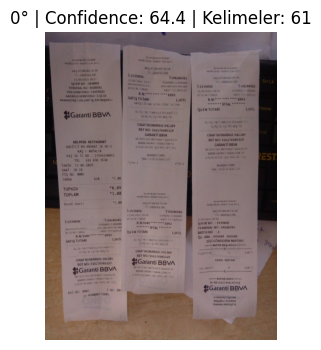

Angle 90° → Conf: 38.9, Keywords: 5


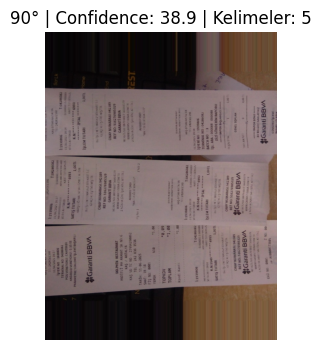

Angle 180° → Conf: 37.5, Keywords: 18


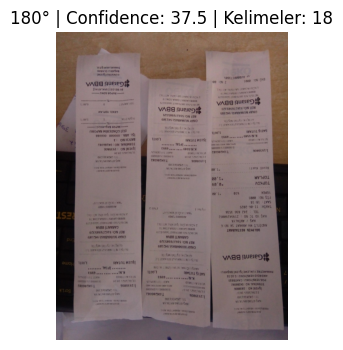

Angle 270° → Conf: 69.7, Keywords: 47


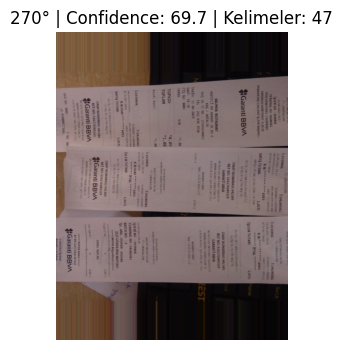

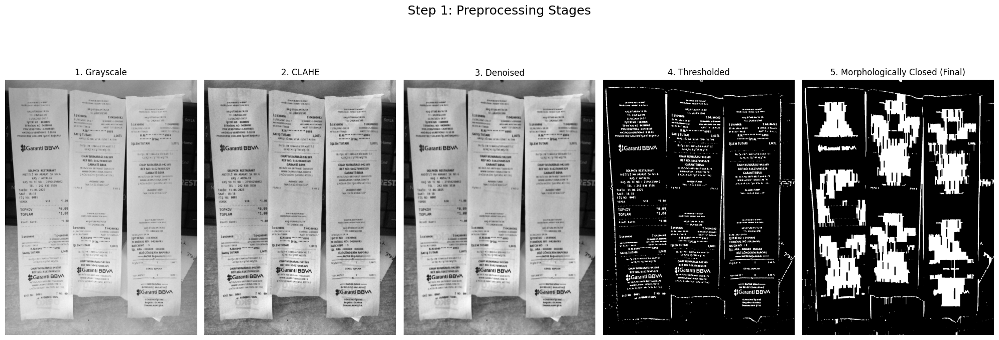

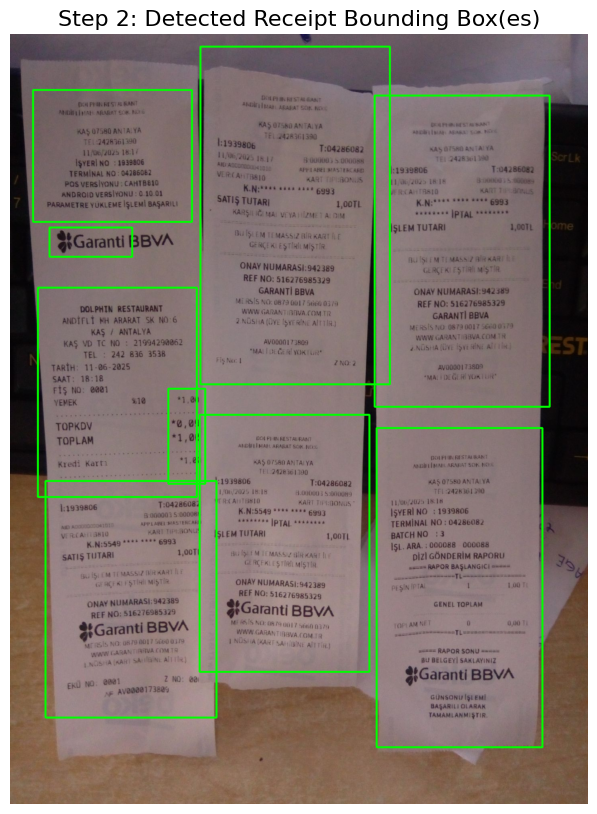

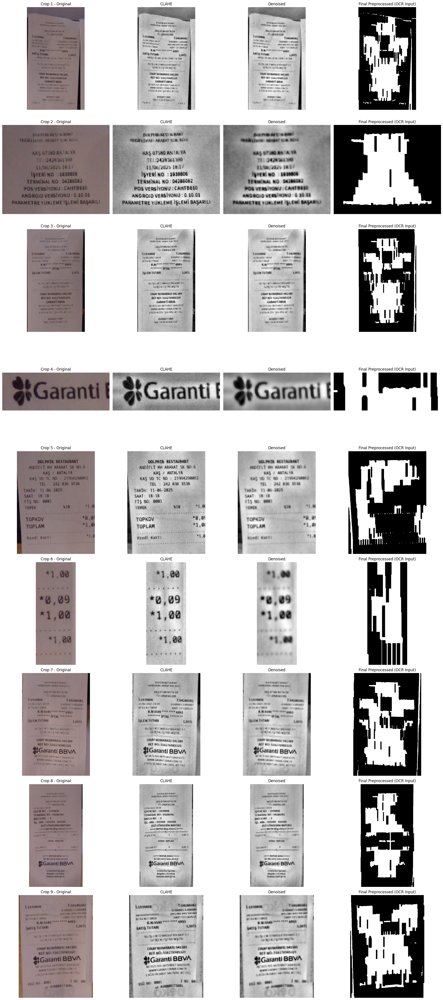

📦 Box 1: (474, 31, 946, 873)
🟣 Tesseract: Sama. an
Mim süasa “e e
Myom ANA ya
© Anim
1193900, 104486084
LAM AZ şaş 4 DAA) ma
bl “00 a 08
“ İT “av “”.a
MN süse 0208 giy
SATIŞ TUTARI 1,00
A e AA VA İğne aş
MİŞ LAM 0 MAZ di A
GM «yi giy vi
ONAY NUMARASI 947189
REF NO: 5162769853449
GARANTİ BBVA
M5 v0 0870 0007 eğ
MAUN ANAN © UNVA COM
ZANA (Ya iyi ie AİT
4V00001 ? 30»
MA: 1 Gi va
“ yı"
🟢 EasyOCR : 1d 8 0 aee Aan 1,1919606 10sau60a, ud 1 o KN 6u9, S41is Tutari Loon a 78 0a6s Mas7naa Onay Numarasi 942 109 Ref No 516276985149 CARANTI BBVA 0880 @u (0i 0600 ailaa Mva ( (u 8as 4(nn>1 Avoooo oo 8eda 4y
✅ Final   : Sama. an
Mim süasa “e e
Myom ANA ya
© Anim
1193900, 104486084
LAM AZ şaş 4 DAA) ma
bl “00 a 08
“ İT “av “”.a
MN süse 0208 giy
SATIŞ TUTARI 1,00
A e AA VA İğne aş
MİŞ LAM 0 MAZ di A
GM «yi giy vi
ONAY NUMARASI 947189
REF NO: 5162769853449
GARANTİ BBVA
M5 v0 0870 0007 eğ
MAUN ANAN © UNVA COM
ZANA (Ya iyi ie AİT
4V00001 ? 30»
MA: 1 Gi va
“ yı"
📦 Box 2: (57, 139, 453, 468)
🟣 Tesseract: İİ
O

ValueError: too many values to unpack (expected 2)

In [40]:
import cv2
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import pytesseract
import easyocr

# ---- STEP 0: Load Original Image ----
image_path = "/content/drive/MyDrive/deneme/492230591-1-ÖKC Dokumani - 17496552534525462950343054186462.jpg"
image_original = cv2.imread(image_path)
image_rotated, angle, _ = validate_rotation_with_ocr(image_original, lang='tur', debug=True)

# ---- STEP 1: Run full preprocessing ----
preprocessed = robust_preprocess_for_receipts(image_rotated, debug=False)

# Visualize all key preprocessing outputs
titles = ["1. Grayscale", "2. CLAHE", "3. Denoised", "4. Thresholded", "5. Morphologically Closed (Final)"]
keys   = ["gray", "clahe", "denoised", "thresholded", "final"]

plt.figure(figsize=(20, 8))
for i, (title, key) in enumerate(zip(titles, keys)):
    img = preprocessed[key]
    cmap = 'gray' if len(img.shape) == 2 else None
    plt.subplot(1, len(keys), i + 1)
    plt.imshow(img, cmap=cmap)
    plt.title(title)
    plt.axis("off")
plt.suptitle("Step 1: Preprocessing Stages", fontsize=18)
plt.tight_layout()
plt.show()

# ---- STEP 2: Receipt Region Detection (bounding boxes) ----
binary_img = preprocessed["final"]
boxes = detect_receipts_with_components(binary_img, image_rotated, debug=False)

# Show bounding boxes on image
image_with_boxes = image_rotated.copy()
for (x1, y1, x2, y2) in boxes:
    cv2.rectangle(image_with_boxes, (x1, y1), (x2, y2), (0, 255, 0), 3)

plt.figure(figsize=(8, 10))
plt.imshow(cv2.cvtColor(image_with_boxes, cv2.COLOR_BGR2RGB))
plt.title("Step 2: Detected Receipt Bounding Box(es)", fontsize=16)
plt.axis("off")
plt.show()

# ---- STEP 3: Crop region + OCR preprocessing ----
fig, axs = plt.subplots(len(boxes), 4, figsize=(20, 5 * len(boxes)))
if len(boxes) == 1:
    axs = axs.reshape(1, -1)

for i, (x1, y1, x2, y2) in enumerate(boxes):
    crop = image_rotated[y1:y2, x1:x2]
    cropped_steps = robust_preprocess_for_receipts(crop, debug=False)

    axs[i, 0].imshow(cv2.cvtColor(crop, cv2.COLOR_BGR2RGB))
    axs[i, 0].set_title(f"Crop {i+1} - Original")
    axs[i, 0].axis("off")

    axs[i, 1].imshow(cropped_steps["clahe"], cmap="gray")
    axs[i, 1].set_title("CLAHE")
    axs[i, 1].axis("off")

    axs[i, 2].imshow(cropped_steps["denoised"], cmap="gray")
    axs[i, 2].set_title("Denoised")
    axs[i, 2].axis("off")

    axs[i, 3].imshow(cropped_steps["final"], cmap="gray")
    axs[i, 3].set_title("Final Preprocessed (OCR Input)")
    axs[i, 3].axis("off")

plt.tight_layout()
plt.show()

# ---- STEP 4: OCR with Dual Model ----
reader = easyocr.Reader(['tr'], gpu=False)  # You can set gpu=True if CUDA is available
ocr_results = extract_text_with_dual_ocr(image_rotated, boxes, easyocr_reader=reader, debug=True, choose_best=True)

# ---- STEP 6: Classify & Extract Fields ----
for i, ((x1, y1, x2, y2), text) in enumerate(ocr_results):
    print("=" * 70)
    print(f"🧾 OCR Result for Box {i+1} → Coordinates: ({x1}, {y1}, {x2}, {y2})")
    print(text)

    receipt_type = classify_receipt_type(text)
    print(f"📌 Detected Receipt Type: {receipt_type}")

    cleaned_fields = extract_fields_from_text(text)
    for key, value in cleaned_fields.items():
        if value:
            print(f"🔍 {key}: {value}")

    print("=" * 70)


In [ ]:
!pip install rapidfuzz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 28.4 MB/s eta 0:00:00


In [38]:
from rapidfuzz import process, fuzz

def extract_field(text, keyword_list, threshold=85):
    lines = text.lower().splitlines()
    for line in lines:
        match, score = process.extractOne(line, keyword_list, scorer=fuzz.partial_ratio)
        if score > threshold:
            return line.strip()
    return None

In [39]:
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer

# Step 5: Feature extraction for clustering
texts = [normalize_turkish(text) for (_, text) in ocr_results]
box_vectors = normalize_boxes([box for (box, _) in ocr_results], image_rotated.shape)

# Optional: Convert texts to TF-IDF vectors
vectorizer = TfidfVectorizer(max_features=50, stop_words='english')
text_vectors = vectorizer.fit_transform(texts).toarray()

# Combine text and layout features (optional)
combined_features = np.hstack([box_vectors, text_vectors])

# Step 6: KMeans Clustering
kmeans = KMeans(n_clusters=4, random_state=42)
labels = kmeans.fit_predict(combined_features)

# Visualize or print clustering result
for i, ((x1, y1, x2, y2), label) in enumerate(zip(boxes, labels)):
    print(f"📦 Box {i+1}: Cluster {label}, Coords ({x1},{y1},{x2},{y2})")


📦 Box 1: Cluster 3, Coords (474,31,946,873)
📦 Box 2: Cluster 2, Coords (57,139,453,468)
📦 Box 3: Cluster 3, Coords (908,153,1344,929)
📦 Box 4: Cluster 0, Coords (98,482,304,555)
📦 Box 5: Cluster 3, Coords (69,632,465,1154)
📦 Box 6: Cluster 3, Coords (394,884,486,1121)
📦 Box 7: Cluster 1, Coords (472,949,895,1590)
📦 Box 8: Cluster 3, Coords (913,982,1326,1778)
📦 Box 9: Cluster 3, Coords (88,1114,514,1704)


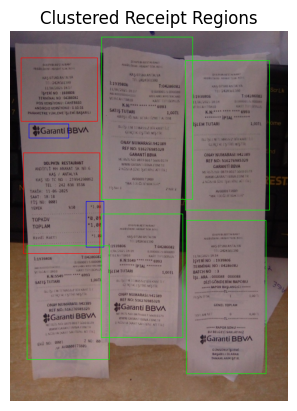

In [ ]:
# Visualize clusters on image
colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255)]
img_copy = image_rotated.copy()
for i, ((x1, y1, x2, y2), label) in enumerate(zip(boxes, labels)):
    cv2.rectangle(img_copy, (x1, y1), (x2, y2), colors[label % len(colors)], 2)
plt.imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))
plt.title("Clustered Receipt Regions")
plt.axis("off")
plt.show()

In [ ]:
texts = [text for (_, text) in ocr_results]

In [ ]:
box_features = normalize_boxes(boxes, image_rotated.shape)

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(max_features=100)  # Adjust as needed
text_embeddings = vectorizer.fit_transform(texts).toarray()  # shape: (n_regions, n_tfidf_features)

In [ ]:
features = np.hstack([box_features, text_embeddings])

In [ ]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=4, random_state=42)
labels = kmeans.fit_predict(features)

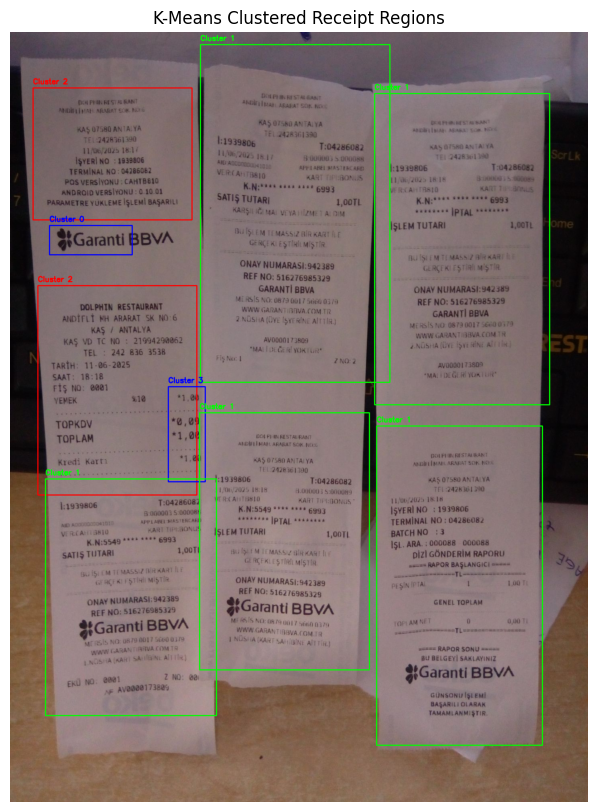

In [ ]:
# --- 6. Visualize clusters on image ---
colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255)]
img_copy = image_rotated.copy()

for i, ((x1, y1, x2, y2), label) in enumerate(zip(boxes, labels)):
    cv2.rectangle(img_copy, (x1, y1), (x2, y2), colors[label % len(colors)], 2)
    cv2.putText(img_copy, f"Cluster {label}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, colors[label % len(colors)], 2)

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))
plt.title("K-Means Clustered Receipt Regions")
plt.axis("off")
plt.show()

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Reduce to 2D for plotting
tsne = TSNE(n_components=2, perplexity=5, random_state=42)
features_2d = tsne.fit_transform(features)

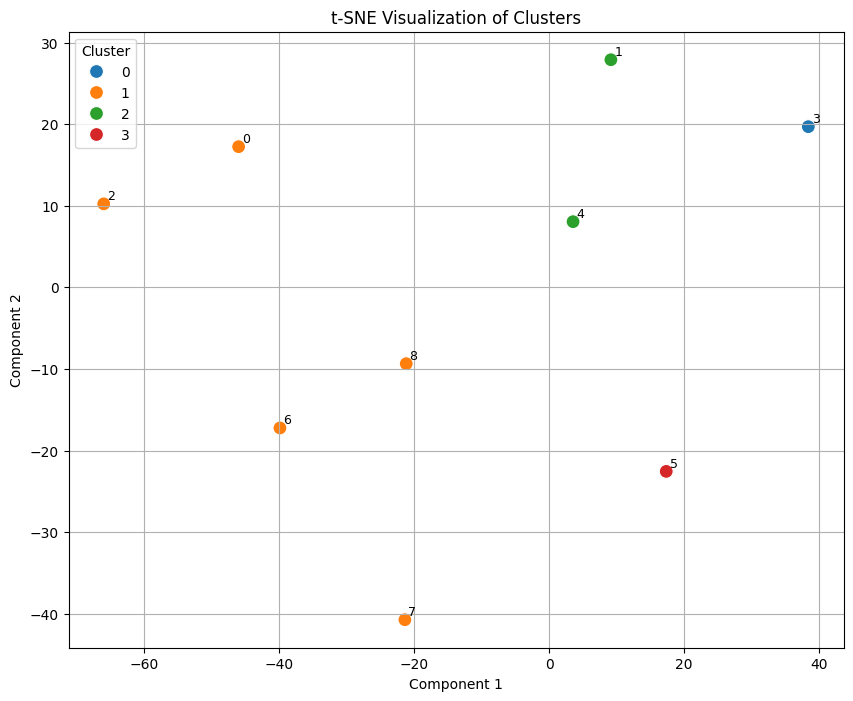

In [ ]:
import seaborn as sns

plt.figure(figsize=(10, 8))
sns.scatterplot(x=features_2d[:, 0], y=features_2d[:, 1], hue=labels, palette="tab10", s=100)

for i, (x, y) in enumerate(features_2d):
    plt.text(x + 0.5, y + 0.5, str(i), fontsize=9)  # Optional: show box index

plt.title("t-SNE Visualization of Clusters")
plt.xlabel("Component 1")
plt.ylabel("Component 2")
plt.legend(title="Cluster")
plt.grid(True)
plt.show()

In [ ]:
for i, (x, y) in enumerate(features_2d):
    plt.text(x + 0.2, y, texts[i][:15], fontsize=8)

In [ ]:
import re
from difflib import get_close_matches

# Step 1: Define the keyword-to-label mapping
keyword_label_map = {
    # Amount-related
    "TOPLAM": "Amount",
    "TUTAR": "Amount",
    "TL": "Amount",
    "GENEL TOPLAM": "Amount",
    "NET": "Amount",
    "1,00TL": "Amount",
    "0,01TL": "Amount",
    "1.00 TL": "Amount",
    "0.01 TL": "Amount",

    # Transaction-related
    "İŞLEM": "Transaction Info",
    "TARİH": "Transaction Info",
    "SAAT": "Transaction Info",
    "ONAY": "Approval Code",
    "ONAY NUMARASI": "Approval Code",
    "BATCH NO": "Batch Info",
    "İŞL. ARA": "Batch Info",

    # Card-related
    "KART": "Card Info",
    "BONUS": "Card Info",

    # Merchant/Customer
    "MÜŞTERİ": "Customer Info",
    "İŞYERİ": "Merchant Info",
    "TERMİNAL": "Terminal Info",

    # Reference & Receipt Info
    "REF": "Reference",
    "REFERANS": "Reference",
    "FİŞ NO": "Receipt Number",
    "FİŞ": "Receipt Number",

    # Receipt Type Heuristics
    "SATIŞ": "Sales Tag",
    "İPTAL": "Cancellation Tag",
    "İPTAL İŞLEM": "Cancellation Tag",
    "GÜNSONU": "End Of Day",
    "RAPOR SONU": "End Of Day",

    # Bank/Brand
    "GARANTİ": "Bank",
    "GARANTİ BBVA": "Bank",
    "DENİZBANK": "Bank",
    "ZİRAAT": "Bank",
}

# Step 2: Assign semantic label to each box based on extracted text
semantic_labels = []

for i, text in enumerate(texts):
    label_assigned = "Unknown"
    upper_text = text.upper()

    # Exact keyword matching
    for keyword, label in keyword_label_map.items():
        if keyword in upper_text:
            label_assigned = label
            break

    # Regex fallback for TL values like 1,00TL or 0,01 TL
    if label_assigned == "Unknown" and re.search(r"\d{1,3}[.,]\d{2}\s*TL", upper_text):
        label_assigned = "Amount"

    # Fuzzy fallback (optional, slower but useful for OCR typos)
    if label_assigned == "Unknown":
        words = re.findall(r"\w+", upper_text)
        for word in words:
            matches = get_close_matches(word, keyword_label_map.keys(), n=1, cutoff=0.9)
            if matches:
                label_assigned = keyword_label_map[matches[0]]
                break

    semantic_labels.append(label_assigned)
    print(f"[Box {i}] Cluster: {labels[i]} → Semantic Label: {label_assigned}")


[Box 0] Cluster: 1 → Semantic Label: Amount
[Box 1] Cluster: 2 → Semantic Label: Unknown
[Box 2] Cluster: 1 → Semantic Label: Amount
[Box 3] Cluster: 0 → Semantic Label: Unknown
[Box 4] Cluster: 2 → Semantic Label: Amount
[Box 5] Cluster: 3 → Semantic Label: Unknown
[Box 6] Cluster: 1 → Semantic Label: Amount
[Box 7] Cluster: 1 → Semantic Label: Amount
[Box 8] Cluster: 1 → Semantic Label: Amount


In [ ]:
receipt_type = "Unknown"

# Combine all uppercased box texts into one string for this image
all_text_upper = " ".join([t.upper() for t in texts])

if "İPTAL" in all_text_upper or "İPTAL İŞLEM" in all_text_upper:
    receipt_type = "Cancellation"
elif "SATIŞ" in all_text_upper or re.search(r"\b1[.,]00\s*TL\b", all_text_upper) or "SATIŞ TUTARI" in all_text_upper:
    receipt_type = "Sales"
elif "PARAMETRE" in all_text_upper:
    receipt_type = "Parameter"
elif "GÜNSONU" in all_text_upper or "RAPOR SONU" in all_text_upper or "GÜN SONU RAPORU" in all_text_upper:
    receipt_type = "End Of Day"
else:
    # Optional: fallback using semantic labels
    if "Cancellation Tag" in semantic_labels:
        receipt_type = "Cancellation"
    elif "Sales Tag" in semantic_labels or semantic_labels.count("Amount") >= 2:
        receipt_type = "Sales"
    elif "End Of Day" in semantic_labels:
        receipt_type = "End Of Day"

print(f"\n📄 Final Receipt Type: {receipt_type}")


📄 Final Receipt Type: Parameter
